In [ ]:
!pip install top2vec top2vec[sentence_encoders] top2vec[indexing]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 88.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 95.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached Cython-0.29.36-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 114.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 46.5 MB/s eta 0:00:00
     ━

In [ ]:
from google.colab import files

uploaded = files.upload()

Saving full_year.csv to full_year.csv


In [ ]:
file_key = list(uploaded.keys())[0]
df = pd.read_csv(file_key)
df.to_csv("/content/drive/MyDrive/full_year_df.csv")

In [ ]:
from top2vec import Top2Vec
import pandas as pd
import os

with open("/content/drive/MyDrive/full_year_df.csv", "r") as f:
  df = pd.read_csv(f)

model = Top2Vec(df['clean_text'].values, embedding_model='universal-sentence-encoder')


model_dir = "models"
os.makedirs(model_dir, exist_ok=True)
model.save(f'./{model_dir}/model_top2vec')

2023-12-06 13:35:54,144 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2023-12-06 13:36:13,554 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model
2023-12-06 13:37:04,031 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2023-12-06 13:37:43,148 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2023-12-06 13:41:28,584 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2023-12-06 13:41:45,409 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [ ]:
model.get_num_topics()

1003

In [ ]:
topic_sizes, topic_nums = model.get_topic_sizes()

In [ ]:
print(topic_sizes)

[4419 4384 3599 ...   16   16   16]


In [ ]:
print(topic_nums)

[   0    1    2 ... 1000 1001 1002]


In [ ]:
topic_words, word_scores, topic_nums = model.get_topics(10)

In [ ]:
# Get the most prominent topics
topics = model.get_topics(num_topics=10)
for topic in topics:
  print(topic)


[['sagittarius' 'sag' 'scorpio' 'aries' 'aquarius' 'pisces' 'astrologers'
  'gemini' 'capricorn' 'libra' 'zodiac' 'astrology' 'rahu' 'spiritual'
  'horoscopes' 'spirituality' 'horoscope' 'taurus' 'astrologer' 'virgo'
  'jyotish' 'leo' 'astro' 'labeling' 'amethyst' 'labels' 'sign' 'label'
  'spiritualism' 'occult' 'gemstone' 'kundalini' 'wiccan' 'wicca'
  'cancer' 'signs' 'chakras' 'solstice' 'tarot' 'ketu' 'mysticism'
  'spiritually' 'vedic' 'pagans' 'religiosity' 'agnostic' 'shamanism'
  'dharma' 'freethinker' 'witchy']
 ['spirituality' 'spiritual' 'spiritualism' 'spiritually' 'ashram'
  'spiritualist' 'mysticism' 'metaphysical' 'samadhi' 'shamanism'
  'spiritualists' 'kundalini' 'namaste' 'tantra' 'osho' 'dharma' 'sufism'
  'meditative' 'vedanta' 'bhakti' 'meditate' 'mindfulness' 'vishnu'
  'deepak' 'enlightenment' 'meditations' 'occultism' 'meditation'
  'introspection' 'mystics' 'tolle' 'thyself' 'transcend' 'oneness'
  'gita' 'rs' 'pagans' 'metaphysics' 'godliness' 'religiosity' '

In [ ]:
print(topic_words)

[['sagittarius' 'sag' 'scorpio' 'aries' 'aquarius' 'pisces' 'astrologers'
  'gemini' 'capricorn' 'libra' 'zodiac' 'astrology' 'rahu' 'spiritual'
  'horoscopes' 'spirituality' 'horoscope' 'taurus' 'astrologer' 'virgo'
  'jyotish' 'leo' 'astro' 'labeling' 'amethyst' 'labels' 'sign' 'label'
  'spiritualism' 'occult' 'gemstone' 'kundalini' 'wiccan' 'wicca'
  'cancer' 'signs' 'chakras' 'solstice' 'tarot' 'ketu' 'mysticism'
  'spiritually' 'vedic' 'pagans' 'religiosity' 'agnostic' 'shamanism'
  'dharma' 'freethinker' 'witchy']
 ['shamanism' 'racial' 'african' 'tribalism' 'bigots' 'racists' 'bigotry'
  'culturally' 'racism' 'bigoted' 'spirituality' 'religions' 'spiritual'
  'discriminate' 'discriminatory' 'supremacist' 'spiritualism' 'africans'
  'racist' 'religion' 'apartheid' 'animism' 'adherents' 'spiritualist'
  'prejudice' 'ethnicity' 'segregation' 'sectarianism' 'indigenous'
  'whiteness' 'poc' 'blacks' 'supremacists' 'humanism' 'discrimination'
  'caste' 'minorities' 'race' 'ism' 'abor

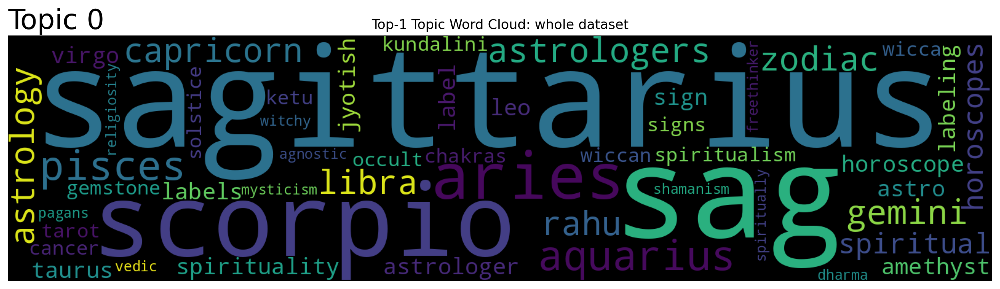

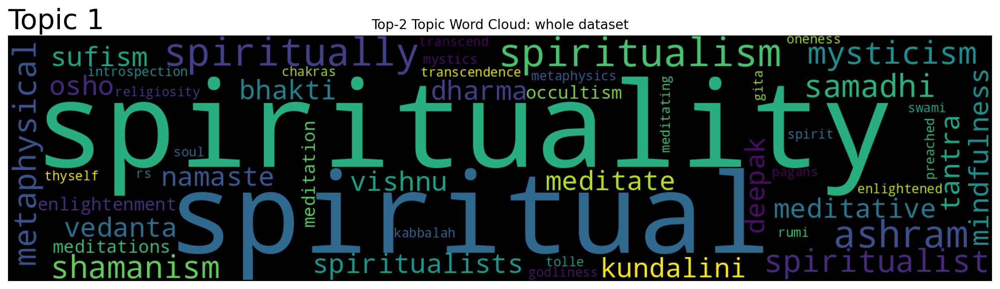

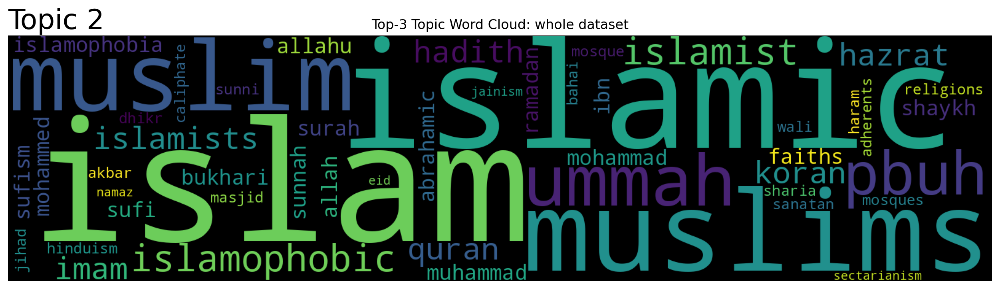

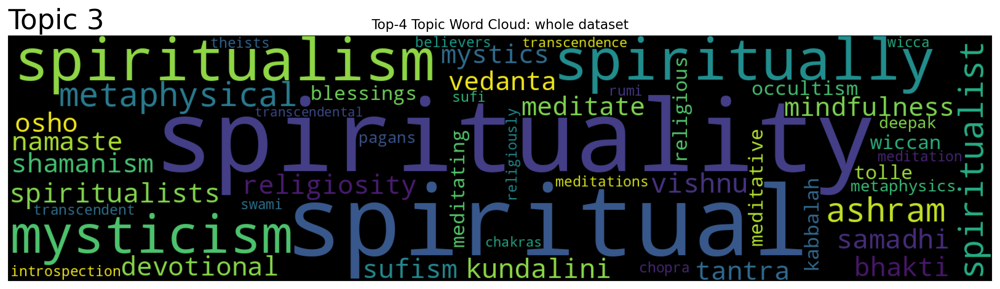

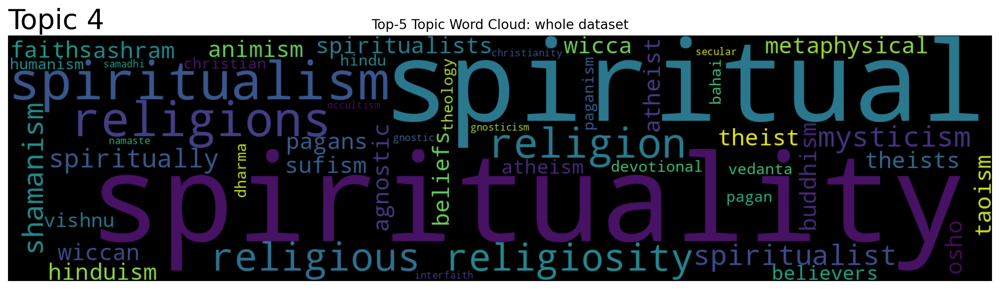

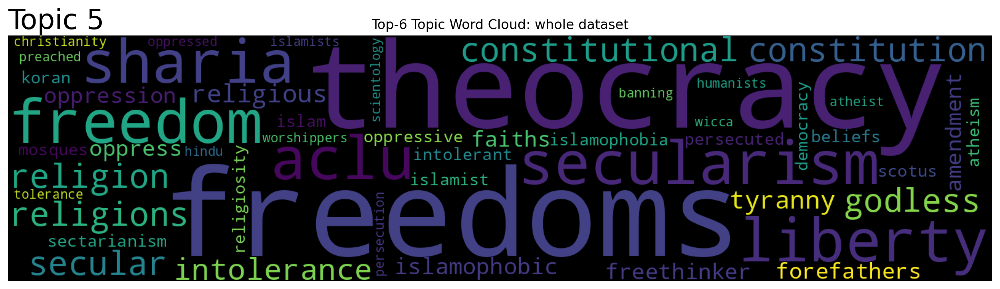

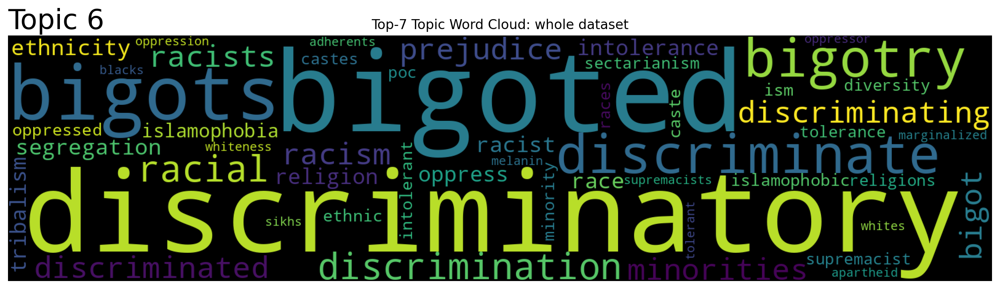

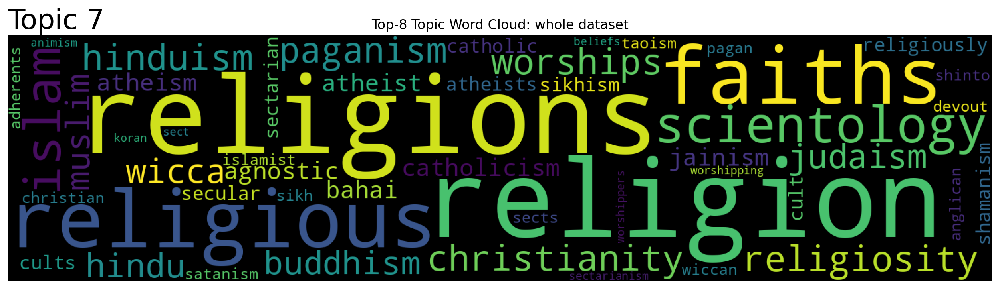

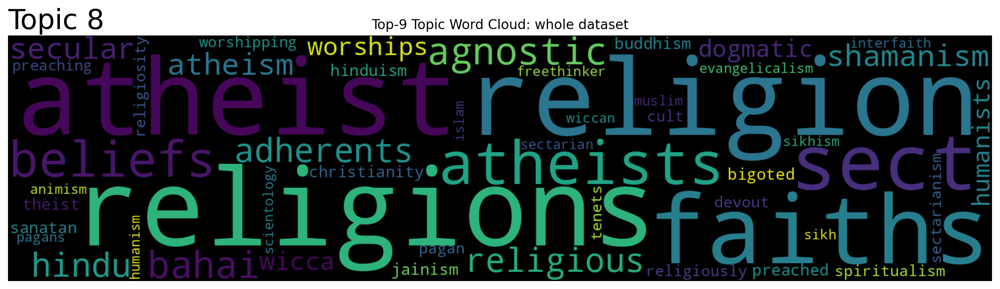

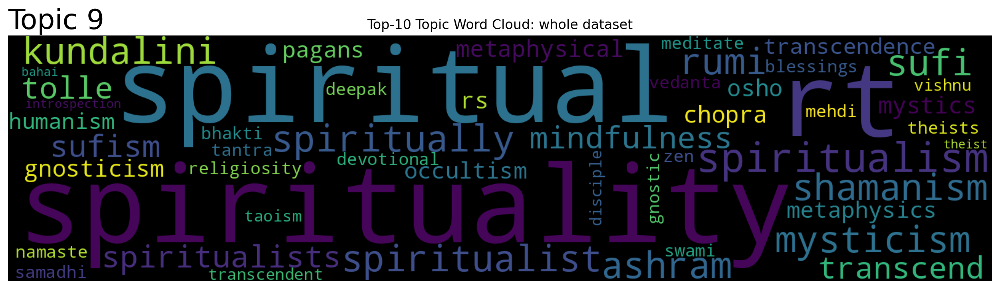

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt


for i, topic in enumerate(topic_nums[:10]):
    model.generate_topic_wordcloud(topic)
    plt.title(f"Top-{i + 1} Topic Word Cloud: whole dataset")
    plt.savefig(f"wordcloud_topic_{i + 1}.png", bbox_inches='tight')
    plt.show()


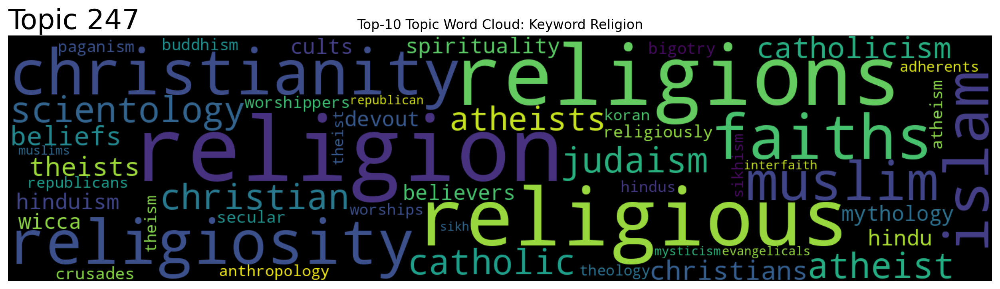

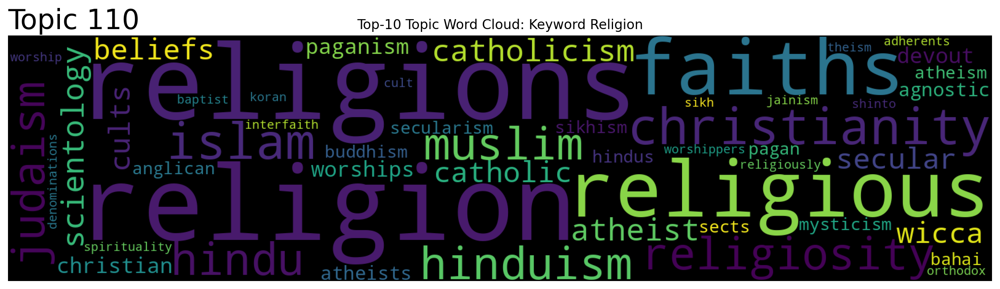

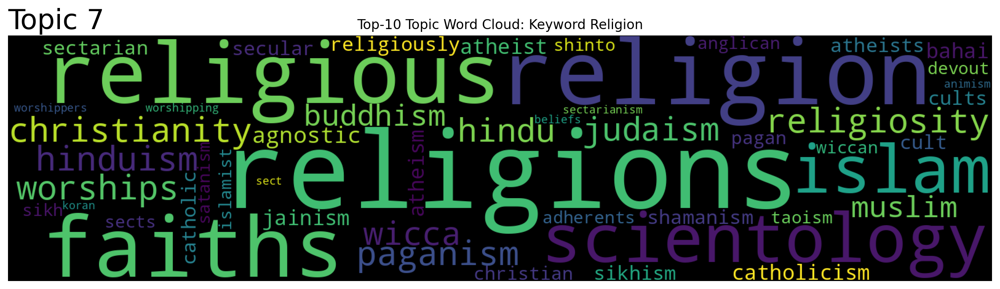

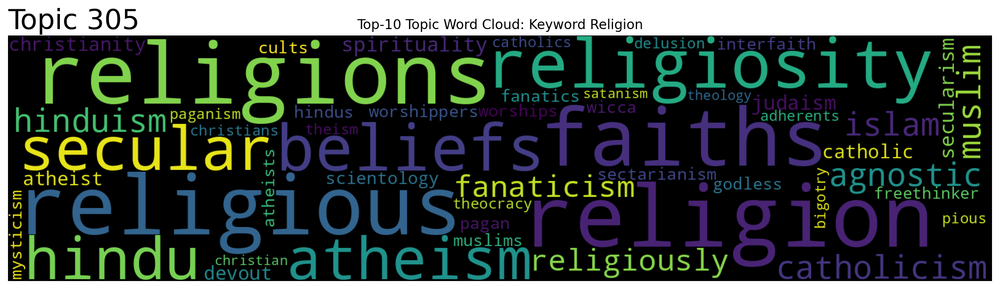

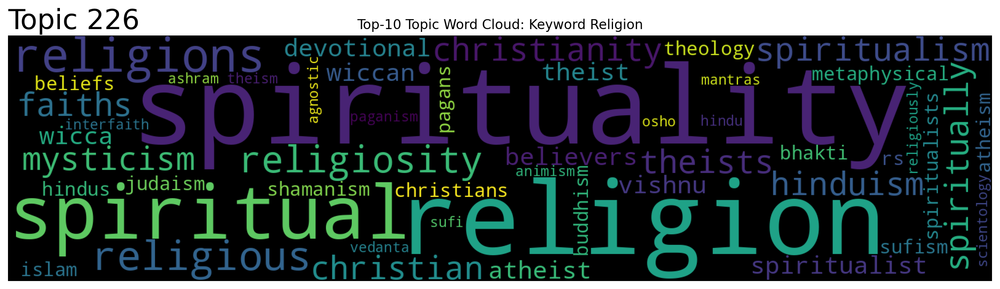

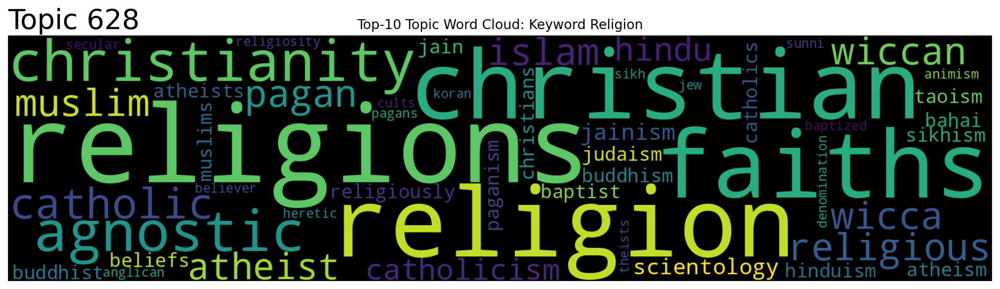

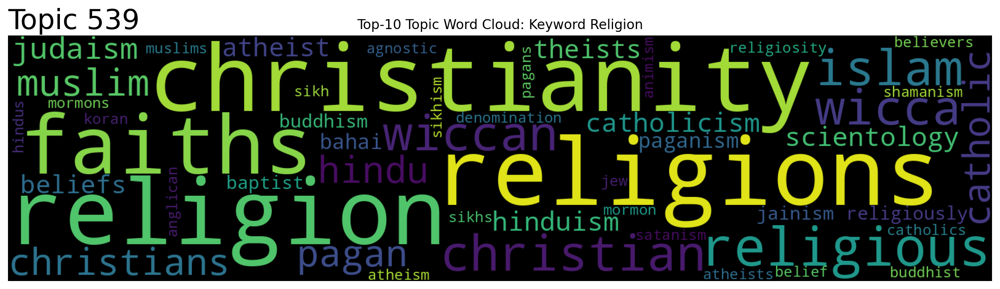

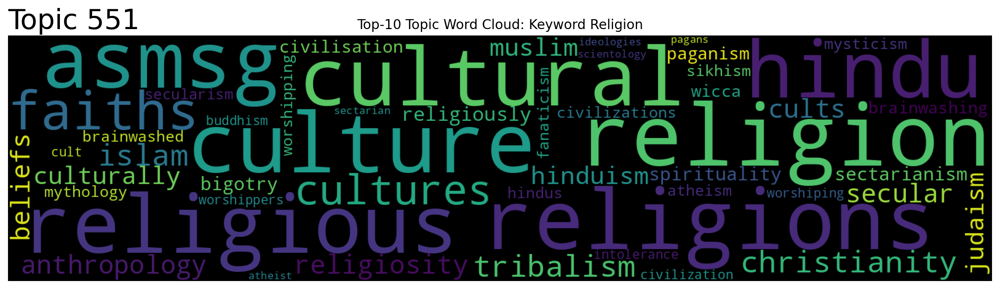

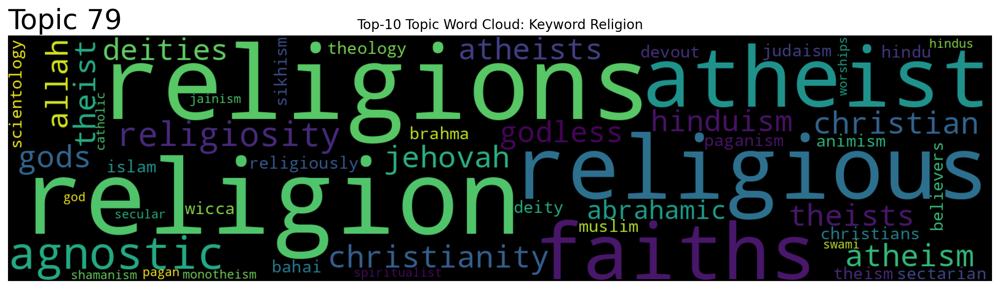

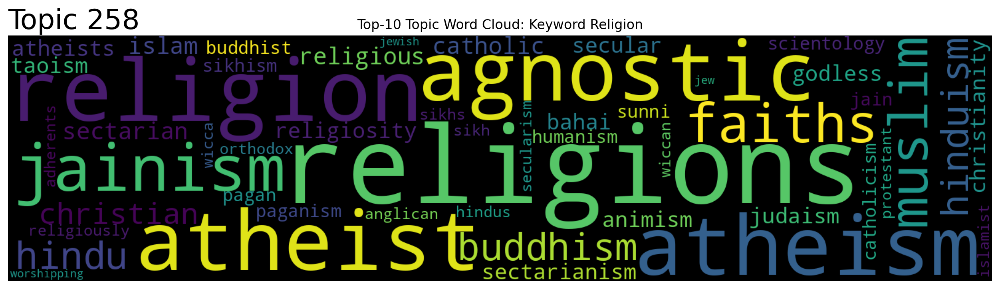

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["religion"], num_topics=10)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)
    plt.title(f"Top-{i + 1} Topic Word Cloud: Keyword Religion")
    plt.savefig(f"wordcloud_religion_topic_{i + 1}.png", bbox_inches='tight')
    plt.show()

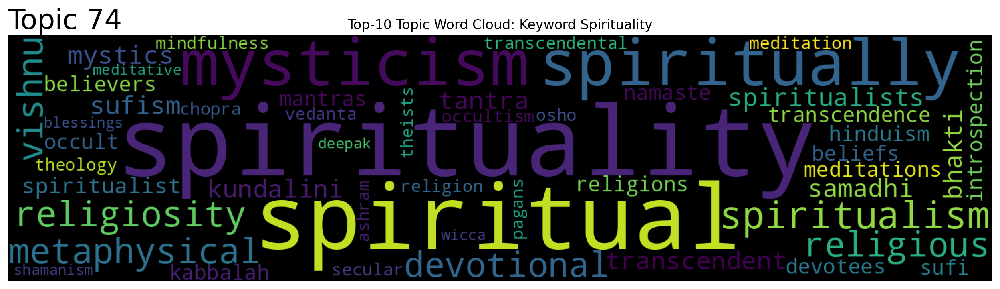

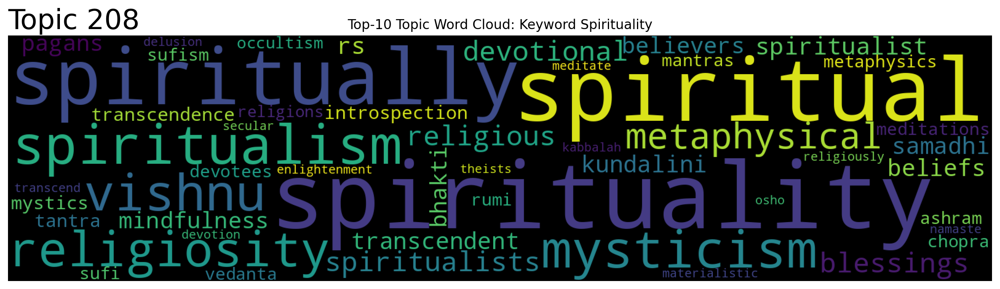

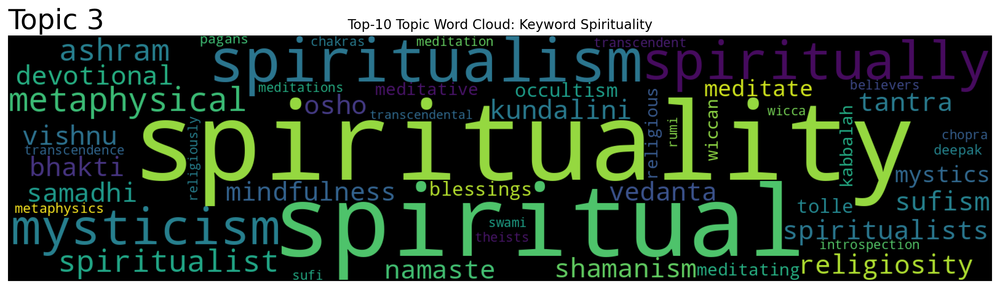

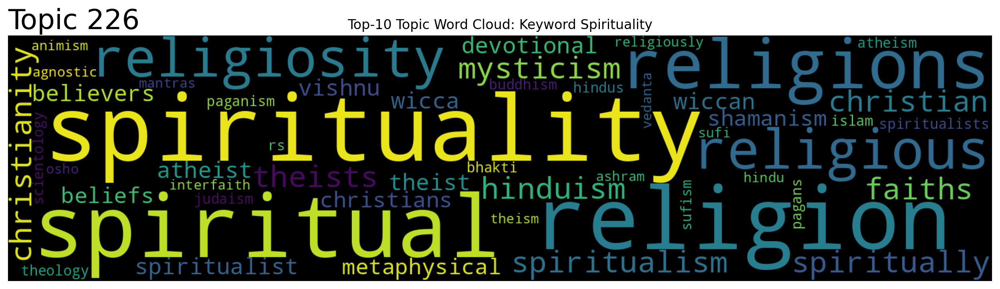

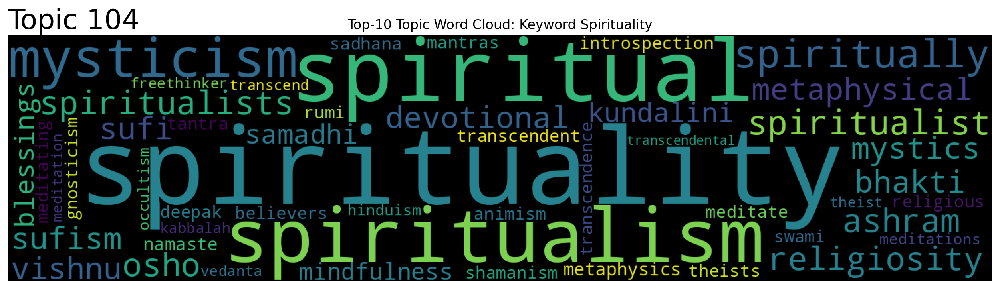

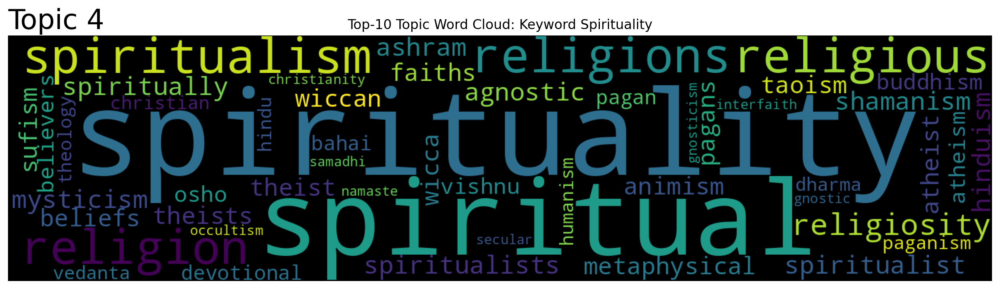

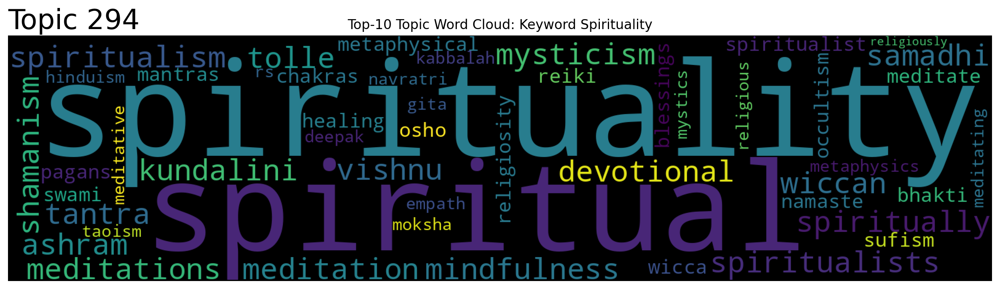

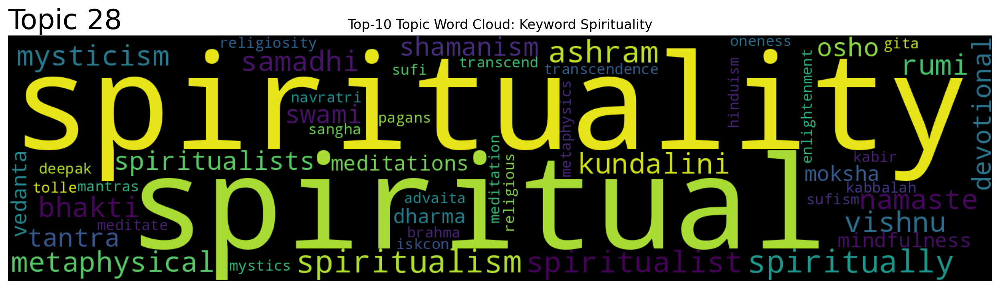

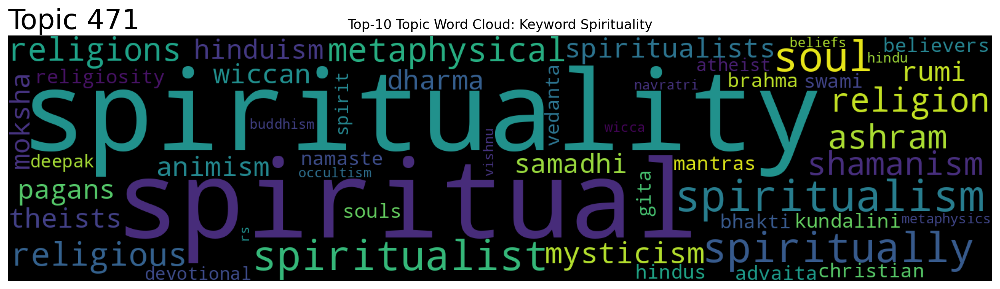

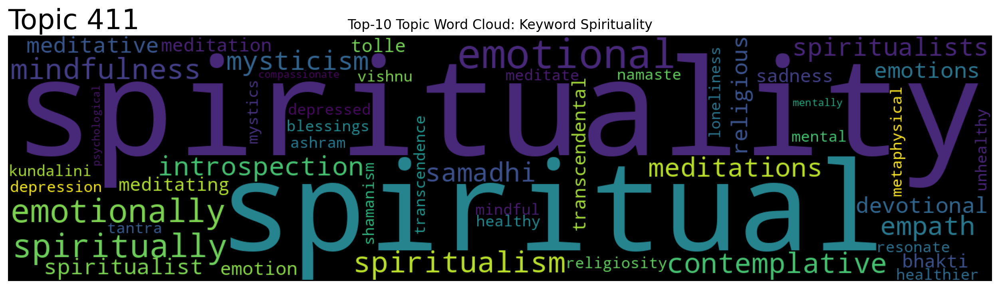

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["spirituality"], num_topics=10)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)
    plt.title(f"Top-{i + 1} Topic Word Cloud: Keyword Spirituality")
    plt.savefig(f"wordcloud_spirituality_topic_{i + 1}.png", bbox_inches='tight')
    plt.show()